## Elucidating the selection dynamics of a coevolving microbial mutualism
#### Yee Mey Seah, Wooyoung Kim, Kristina Hillesland

Microbial species can cooperate metabolically in mutualistic relationships called syntrophy. Syntrophies play a significant role in carbon degradation in anoxic environments. In order to study the evolutionary dynamics of mutualism, we sequenced the first 1000 generations of experimentally-evolving anaerobic Desulfovibrio vulgaris Hildenborough and methanogenic archaea Methanococcus maripaludis S2. These populations have been cocultured for over 4000 generations, in conditions that require both microbes to cooperate for survival. D. vulgaris ferments lactate, producing hydrogen that is consumed by M. maripaludis, which in return provides a thermodynamically favorable environment for continued fermentation by D. vulgaris. We identified allele frequency changes that suggest selection fluctuates during the establishment of the nascent mutualism. While negative frequency-dependent selection is more often used to model the coevolutionary dynamics of antagonistic host-parasite relationship, we demonstrate that negative frequency-dependent selection is also observed during the evolution of mutualism. This can occur due to mismatch in mutualist partner quality and compatibility – a rare genotype is selected for by a common mutualist partner, but the common mutualist partner fitness is negatively affected by the rare genotype, causing it to decline in frequency while another genotype of the partner species becomes common. The whole population sequencing approach allows us to now study the coevolutionary genomics of mutualism, which had been more commonly investigated through phenotypic traits, and gives us insight into the reciprocal changes in both partners’ genomes.

##### Tasks
1. ~~List all accepted mutations based on breseq evidence, and include those that did not meet frequency threshold in earlier generations.~~
2. ~~Make frequency plots.~~
3. Estimate selection coefficients of bi-allelic SNPs. See grc2019.Rmd.   
    3a. ~~Get number of reads supporting ref and alt.~~    
    3b. ~~Use lme4 package in R to fit GLMM (see SI appendix from Papkou et al., 2018)~~
    3c. Use emmeans package in R to calculate s (see SI appendix from Papkou et al., 2018)
4. Make Muller plots.

### Population allele frequencies

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

_mutations.csv and _evidence.csv files generated with rd_filter_mutations/01_gd_to_dataframe.py for the following samples: U1-15, UA3.45, U1-76, UE3780, UE31000, UE31100, UE31200, UE31500, UE31600, UE31700, UE31800, UE31900, UE32000, UE32100, UE32200, UE32300, UE32400, UE32600, UE32800, UE33000.

Files were then concatenated for downstream analyses.

```
cat *_mutations.csv > tmp.csv
awk ' /^sample/ && FNR > 1 {next} {print $0} ' tmp.csv > ua3_3000_mutations.csv

cat *_evidence.csv > tmp.csv
awk ' /^sample/ && FNR > 1 {next} {print $0} ' tmp.csv > ua3_3000_evidence.csv
```

In [2]:
ua3_mutations = pd.read_csv('/Users/ymseah/Repositories/dvh_mms2/notebooks/data_exploration/input/ua3_3000_mutations.csv')
ua3_evidence = pd.read_csv('/Users/ymseah/Repositories/dvh_mms2/notebooks/data_exploration/input/ua3_3000_evidence.csv')

In [3]:
#ancestor_mut = pd.read_csv('/Users/ymseah/Repositories/dvh_mms2/notebooks/data_exploration/input/Ancestor_mutations.csv')
#ancestor_ev = pd.read_csv('/Users/ymseah/Repositories/dvh_mms2/notebooks/data_exploration/input/Ancestor_evidence.csv')
d2m1_mut = pd.read_csv('/Users/ymseah/Repositories/dvh_mms2/notebooks/data_exploration/input/D2M1_mutations.csv')
d2m1_ev = pd.read_csv('/Users/ymseah/Repositories/dvh_mms2/notebooks/data_exploration/input/D2M1_evidence.csv')

In [4]:
ua3_mutations = pd.concat([d2m1_mut, ua3_mutations], ignore_index=True, sort=False)
ua3_evidence = pd.concat([d2m1_ev, ua3_evidence], ignore_index=True, sort=False)

In [5]:
#Edit position column for JC evidence to reflect mutation position. 
#Original JC position values copied to new column, jc_mut_position
ua3_evidence['jc_mut_position'] = ua3_evidence['position']
ua3_evidence.position = ua3_evidence.position.mask(ua3_evidence.entry_type == 'JC', ua3_evidence.position + 1)

#https://stackoverflow.com/questions/41534428/how-do-i-perform-a-math-operation-on-a-python-pandas-dataframe-column-but-only
#http://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.mask.html

In [6]:
ua3_evidence.to_csv('~/Repositories/dvh_mms2/notebooks/data_exploration/input/ua3_3000_evidence_jc_edit.csv', index=False)

In [7]:
ua3_rejected = ua3_evidence[pd.isna(ua3_evidence.reject) == False]
ua3_rejected

,sample,line,generation,entry_type,entry_id,genome_id,position,REF,ALT,reject,prediction,polymorphism_frequency,major_cov,minor_cov,total_cov,ra_cov,jc_cov,mc_cov,jc_mut_position
1,D2M1,UA3,0,RA,178,NC_002937,22434,G,.,FREQUENCY_CUTOFF,polymorphism,0.016451,238.0,4.0,243.0,4.0,NaN,NaN,22434
2,D2M1,UA3,0,RA,179,NC_002937,22439,C,G,FREQUENCY_CUTOFF,polymorphism,0.020063,243.0,5.0,249.0,5.0,NaN,NaN,22439
3,D2M1,UA3,0,RA,180,NC_002937,22442,.,C,FREQUENCY_CUTOFF,polymorphism,0.019608,250.0,5.0,255.0,5.0,NaN,NaN,22442
4,D2M1,UA3,0,RA,181,NC_002937,29498,.,T,FREQUENCY_CUTOFF,polymorphism,0.013332,148.0,2.0,150.0,2.0,NaN,NaN,29498
5,D2M1,UA3,0,RA,182,NC_002937,29503,.,T,FREQUENCY_CUTOFF,polymorphism,0.016129,122.0,2.0,124.0,2.0,NaN,NaN,29503
6,D2M1,UA3,0,RA,183,NC_002937,29508,G,.,FREQUENCY_CUTOFF,polymorphism,0.029401,132.0,4.0,136.0,4.0,NaN,NaN,29508
7,D2M1,UA3,0,RA,184,NC_002937,29509,C,T,FREQUENCY_CUTOFF,polymorphism,0.029339,131.0,4.0,136.0,4.0,NaN,NaN,29509
8,D2M1,UA3,0,RA,185,NC_002937,29512,T,C,FREQUENCY_CUTOFF,polymorphism,0.027455,141.0,4.0,145.0,4.0,NaN,NaN,29512
10,D2M1,UA3,0,RA,187,NC_002937,43916,A,G,FREQUENCY_CUTOFF,polymorphism,0.020449,237.0,5.0,243.0,5.0,NaN,NaN,43916
11,D2M1,UA3,0,RA,188,NC_002937,43928,A,C,FREQUENCY_CUTOFF,polymorphism,0.017970,219.0,4.0,223.0,4.0,NaN,NaN,43928


Bash code used to extract mutations (based on genome id and position) that are rejected in one timepoint and accepted in another. The logic is to first find unique lines based on entry type, genome id, position, and reject status (```-f4,6,7,10```). This is followed by dropping only the reject status column, and getting the counts for each unique line. Counts greater than 1 (```egrep "\s+[2-9]+\s+```) imply that before the second ```cut```, there were lines with the same entry type, genome id and position, but different reject status.

```
cat ua3_3000_evidence_jc_edit.csv | cut -d, -f4,6,7,10 | sort | uniq | cut -d, -f 1,2,3 | uniq -c | egrep "\s+[2-9]+\s+" | tr -s ' ' | cut -d' ' -f3 > ua3_3000_evid_multiple.csv
```

In [8]:
dup_muts = pd.read_csv('~/Repositories/dvh_mms2/notebooks/data_exploration/input/ua3_3000_evid_multiple.csv', header=None)
dup_muts.rename(columns = {0: 'entry_type', 1: 'genome_id', 2: 'position'}, inplace=True)
muts_with_rejects = pd.merge(ua3_mutations, dup_muts, how='inner', on=['genome_id', 'position'])
muts_with_rejects.rename(columns = {'entry_type_y': 'entry_type'}, inplace=True)
muts_with_rejects

,sample,line,generation,entry_type_x,entry_id,evidence_id,genome_id,position,mutation_detail,frequency,...,reject,prediction,polymorphism_frequency,major_cov,minor_cov,total_cov,ra_cov,jc_cov,mc_cov,entry_type
0,D2M1,UA3,0,DEL,28,5770,NC_002937,1306633,40,0.091015,...,NaN,polymorphism,0.091015,NaN,NaN,NaN,NaN,12.0,NaN,JC
1,UE3-1000,UE3,1000,DEL,65,19769,NC_002937,1306633,40,0.073601,...,NaN,polymorphism,0.073601,NaN,NaN,NaN,NaN,38.0,NaN,JC
2,D2M1,UA3,0,DEL,29,5771,NC_002937,1306679,20,0.152443,...,NaN,polymorphism,0.152443,NaN,NaN,NaN,NaN,18.0,NaN,JC
3,D2M1,UA3,0,SNP,42,672,NC_002937,2184834,A,0.059177,...,NaN,polymorphism,0.059177,207.0,13.0,220.0,13.0,NaN,NaN,RA
4,UE3-1000,UE3,1000,SNP,98,5268,NC_002937,2184834,A,0.083388,...,NaN,polymorphism,0.083388,615.0,56.0,671.0,56.0,NaN,NaN,RA
5,UE3-1100,UE3,1100,SNP,108,4597,NC_002937,2184834,A,0.089952,...,NaN,polymorphism,0.089952,427.0,42.0,470.0,42.0,NaN,NaN,RA
6,UE3-1200,UE3,1200,SNP,125,3954,NC_002937,2184834,A,0.069212,...,NaN,polymorphism,0.069212,483.0,36.0,520.0,36.0,NaN,NaN,RA
7,UE3-1500,UE3,1500,SNP,134,4316,NC_002937,2184834,A,0.080940,...,NaN,polymorphism,0.080940,384.0,34.0,418.0,34.0,NaN,NaN,RA
8,UE3-1600,UE3,1600,SNP,138,4315,NC_002937,2184834,A,0.089395,...,NaN,polymorphism,0.089395,487.0,48.0,535.0,48.0,NaN,NaN,RA
9,UE3-1700,UE3,1700,SNP,134,3279,NC_002937,2184834,A,0.071498,...,NaN,polymorphism,0.071498,556.0,43.0,599.0,43.0,NaN,NaN,RA


In [34]:
rejected_muts = pd.merge(ua3_rejected, muts_with_rejects[['genome_id', 'position', 'entry_type']], how='inner', on=['genome_id', 'position', 'entry_type'])
rejected_muts.insert(5, 'evidence_id', np.nan)
rejected_muts.insert(8, 'mutation_detail', np.nan)
rejected_muts.insert(9, 'frequency', np.nan)
rejected_muts.insert(10, 'gene_product', np.nan)
rejected_muts.insert(11, 'evidence_type', np.nan)
rejected_muts.drop('jc_mut_position', axis=1, inplace=True)

In [35]:
rejected_muts.drop_duplicates(inplace=True)
rejected_muts

,sample,line,generation,entry_type,entry_id,evidence_id,genome_id,position,mutation_detail,frequency,...,ALT,reject,prediction,polymorphism_frequency,major_cov,minor_cov,total_cov,ra_cov,jc_cov,mc_cov
0,D2M1,UA3,0,RA,189,NaN,NC_002937,66459,NaN,NaN,...,A,FREQUENCY_CUTOFF,polymorphism,0.041142,92.0,4.0,97.0,4.0,NaN,NaN
1,U1-76,U1,500,RA,160,NaN,NC_002937,66459,NaN,NaN,...,A,STRAND_COVERAGE,polymorphism,0.074964,37.0,3.0,40.0,3.0,NaN,NaN
2,D2M1,UA3,0,RA,190,NaN,NC_002937,66460,NaN,NaN,...,G,FREQUENCY_CUTOFF,polymorphism,0.040944,93.0,4.0,97.0,4.0,NaN,NaN
3,D2M1,UA3,0,RA,247,NaN,NC_002937,215024,NaN,NaN,...,T,STRAND_COVERAGE,polymorphism,0.075607,121.0,10.0,132.0,10.0,NaN,NaN
18,UE3-1600,UE3,1600,RA,858,NaN,NC_002937,215024,NaN,NaN,...,T,FISHER_STRAND,polymorphism,0.083550,513.0,47.0,560.0,47.0,NaN,NaN
33,U1-15,U1,100,RA,178,NaN,NC_002937,215024,NaN,NaN,...,T,STRAND_COVERAGE,polymorphism,0.068340,68.0,5.0,73.0,5.0,NaN,NaN
48,U1-76,U1,500,RA,173,NaN,NC_002937,215024,NaN,NaN,...,T,STRAND_COVERAGE,polymorphism,0.101836,44.0,5.0,49.0,5.0,NaN,NaN
63,UA3s-45,UA3,300,RA,348,NaN,NC_002937,215024,NaN,NaN,...,T,FREQUENCY_CUTOFF,polymorphism,0.030977,279.0,9.0,288.0,9.0,NaN,NaN
78,D2M1,UA3,0,RA,248,NaN,NC_002937,215055,NaN,NaN,...,T,STRAND_COVERAGE,polymorphism,0.061407,122.0,8.0,130.0,8.0,NaN,NaN
94,D2M1,UA3,0,RA,249,NaN,NC_002937,215062,NaN,NaN,...,C,STRAND_COVERAGE,polymorphism,0.056326,117.0,7.0,124.0,7.0,NaN,NaN


In [36]:
new_ua3 = pd.concat([ua3_mutations,rejected_muts], ignore_index=True, sort=False)
new_ua3.drop_duplicates(inplace=True)
new_ua3['line'] = 'UA3'
new_ua3

,sample,line,generation,entry_type,entry_id,evidence_id,genome_id,position,mutation_detail,frequency,...,ALT,reject,prediction,polymorphism_frequency,major_cov,minor_cov,total_cov,ra_cov,jc_cov,mc_cov
0,D2M1,UA3,0,SNP,1,177,NC_002937,5565,A,1.000000,...,A,NaN,consensus,1.000000,290.0,0.0,290.0,290.0,NaN,NaN
1,D2M1,UA3,0,DEL,2,5695,NC_002937,5969,48,0.050690,...,6017,NaN,polymorphism,0.050690,NaN,NaN,NaN,NaN,8.0,NaN
2,D2M1,UA3,0,INS,3,186,NC_002937,42867,G,1.000000,...,G,NaN,consensus,0.995775,234.0,1.0,235.0,234.0,NaN,NaN
3,D2M1,UA3,0,DEL,4,5701,NC_002937,80835,27,0.092332,...,80862,NaN,polymorphism,0.092332,NaN,NaN,NaN,NaN,9.0,NaN
4,D2M1,UA3,0,DEL,5,5706,NC_002937,169790,18,0.063098,...,169808,NaN,polymorphism,0.063098,NaN,NaN,NaN,NaN,11.0,NaN
5,D2M1,UA3,0,DEL,6,5709,NC_002937,183266,78,0.150884,...,183344,NaN,polymorphism,0.150884,NaN,NaN,NaN,NaN,22.0,NaN
6,D2M1,UA3,0,SNP,7,235,NC_002937,183355,G,0.053234,...,G,NaN,polymorphism,0.053234,213.0,12.0,225.0,12.0,NaN,NaN
7,D2M1,UA3,0,INS,8,244,NC_002937,211389,A,1.000000,...,A,NaN,consensus,1.000000,204.0,0.0,204.0,204.0,NaN,NaN
8,D2M1,UA3,0,DEL,9,5724,NC_002937,418037,54,0.070489,...,418091,NaN,polymorphism,0.070489,NaN,NaN,NaN,NaN,30.0,NaN
9,D2M1,UA3,0,DEL,10,5729,NC_002937,450104,30,0.117413,...,450134,NaN,polymorphism,0.117413,NaN,NaN,NaN,NaN,17.0,NaN


In [37]:
new_ua3.to_csv('~/Repositories/dvh_mms2/notebooks/data_exploration/output/new_ua3_3000_mutations.csv', index=False)

In [38]:
# test 
new_ua3[new_ua3['position'] == 999707]

,sample,line,generation,entry_type,entry_id,evidence_id,genome_id,position,mutation_detail,frequency,...,ALT,reject,prediction,polymorphism_frequency,major_cov,minor_cov,total_cov,ra_cov,jc_cov,mc_cov
563,UE3-1100,UA3,1100,SNP,42,2958,NC_002937,999707,T,0.050852,...,T,NaN,polymorphism,0.050852,205.0,11.0,216.0,11.0,NaN,NaN
925,UE3-1200,UA3,1200,SNP,48,2394,NC_002937,999707,T,0.103428,...,T,NaN,polymorphism,0.103428,233.0,27.0,260.0,27.0,NaN,NaN
1304,UE3-1500,UA3,1500,SNP,47,2752,NC_002937,999707,T,0.086884,...,T,NaN,polymorphism,0.086884,168.0,16.0,184.0,16.0,NaN,NaN
2122,UE3-1700,UA3,1700,SNP,51,1986,NC_002937,999707,T,0.052561,...,T,NaN,polymorphism,0.052561,306.0,17.0,323.0,17.0,NaN,NaN
2502,UE3-1800,UA3,1800,SNP,57,2484,NC_002937,999707,T,0.067894,...,T,NaN,polymorphism,0.067894,315.0,23.0,338.0,23.0,NaN,NaN
8780,UE3-1000,UA3,1000,RA,3156,NaN,NC_002937,999707,NaN,NaN,...,T,FREQUENCY_CUTOFF,polymorphism,0.032351,358.0,12.0,370.0,12.0,NaN,NaN
8781,UE3-1600,UA3,1600,RA,2518,NaN,NC_002937,999707,NaN,NaN,...,T,FREQUENCY_CUTOFF,polymorphism,0.041595,253.0,11.0,264.0,11.0,NaN,NaN
8782,UE3-1900,UA3,1900,RA,1996,NaN,NC_002937,999707,NaN,NaN,...,T,FREQUENCY_CUTOFF,polymorphism,0.034633,306.0,11.0,317.0,11.0,NaN,NaN
8783,UE3-2000,UA3,2000,RA,2276,NaN,NC_002937,999707,NaN,NaN,...,T,FREQUENCY_CUTOFF,polymorphism,0.039497,267.0,11.0,278.0,11.0,NaN,NaN
8784,UE3-2100,UA3,2100,RA,2357,NaN,NC_002937,999707,NaN,NaN,...,T,FREQUENCY_CUTOFF,polymorphism,0.043589,241.0,11.0,252.0,11.0,NaN,NaN


In [163]:
def dropallna_col(df):
    '''Use on data frames comprising polymorphism columns and frequency values'''
    #Drop polymorphisms that don't exist, replace remaining NA's with 0%
    retained = df.dropna(how='all', axis=1).fillna(0)
    #Drop polymorphisms that are 100% across all time points, replace remaining NA's with 100%
    filtered = retained.mask(retained == 1.0).dropna(how='all', axis=1).fillna(1.0).copy()
    return filtered

In [155]:
# plotting script adapted from plot_polymorphisms.ipynb
new_ua3['polymorphism'] = new_ua3['position'].astype(str).str.cat(new_ua3['ALT'], sep=' ')
df = new_ua3[['line', 'genome_id', 'generation', 'polymorphism', 'polymorphism_frequency']].copy()
df_pvt = df.pivot_table(index=['genome_id', 'line', 'generation'], columns='polymorphism', values='polymorphism_frequency')

dvh_df = dropallna_col(df_pvt.loc['NC_002937'])
mm_df = dropallna_col(df_pvt.loc['NC_005791'])
dvplasmid_df = dropallna_col(df_pvt.loc['NC_005863'])

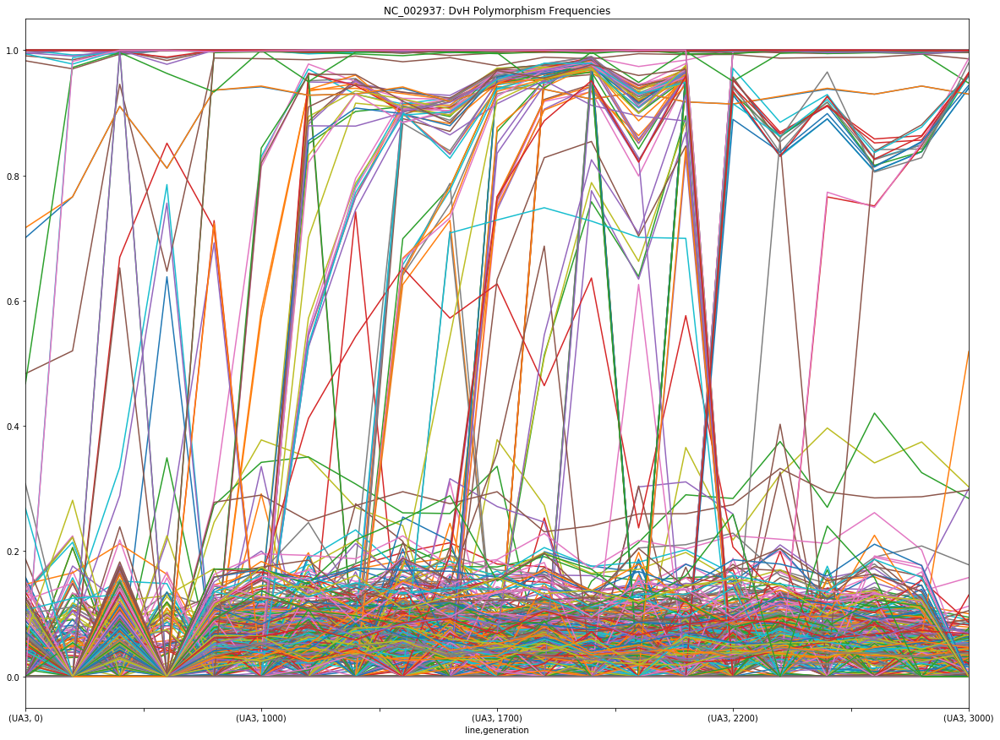

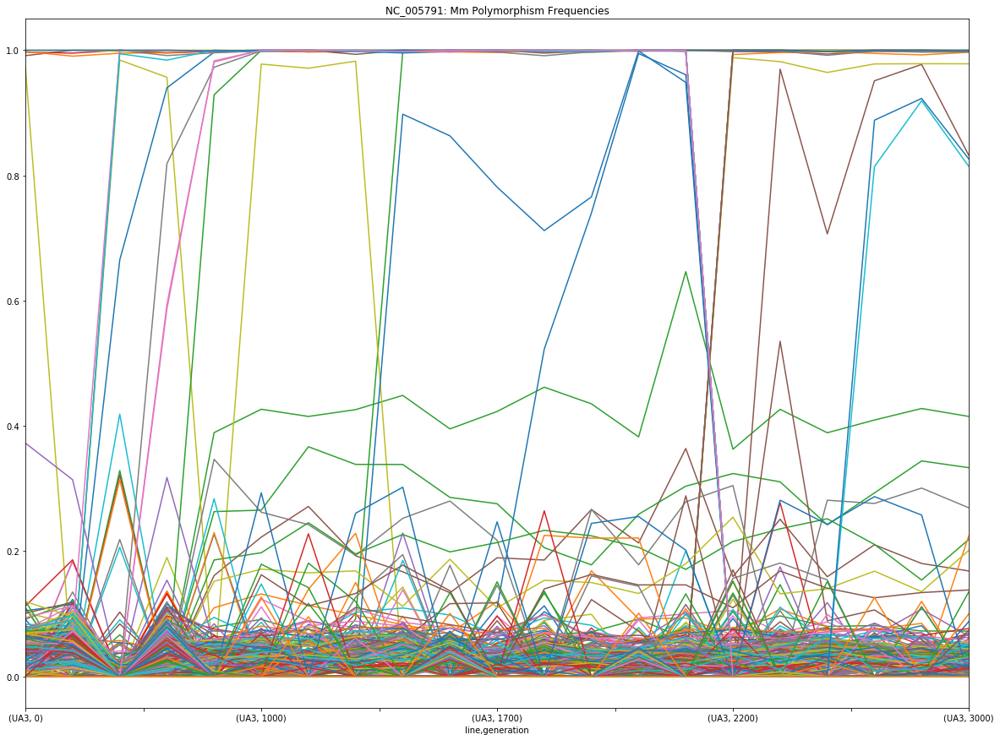

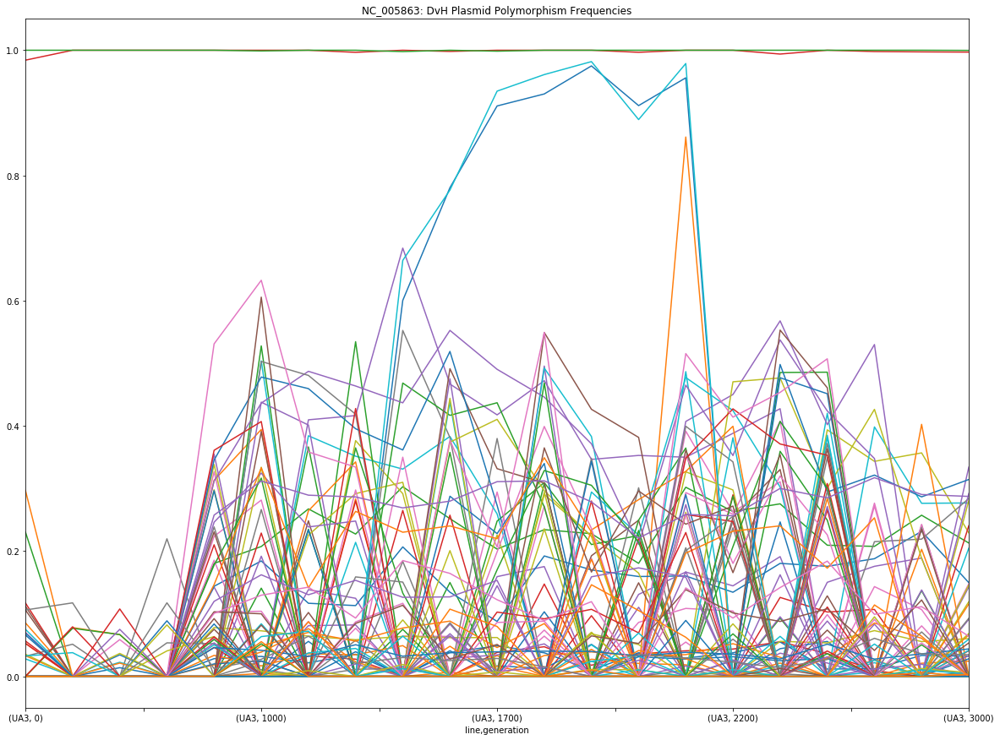

In [159]:
%matplotlib inline
dvh_df.plot(figsize = (20,15), legend=False, title='NC_002937: DvH Polymorphism Frequencies')
plt.savefig('figures/grc2019ua3dvhcorrected.png')

mm_df.plot(figsize = (20,15), legend=False, title='NC_005791: Mm Polymorphism Frequencies')
plt.savefig('figures/grc2019ua3mmcorrected.png')

dvplasmid_df.plot(figsize = (20,15), legend=False, title='NC_005863: DvH Plasmid Polymorphism Frequencies')
plt.savefig('figures/grc2019ua3dvplasmidcorrected.png')

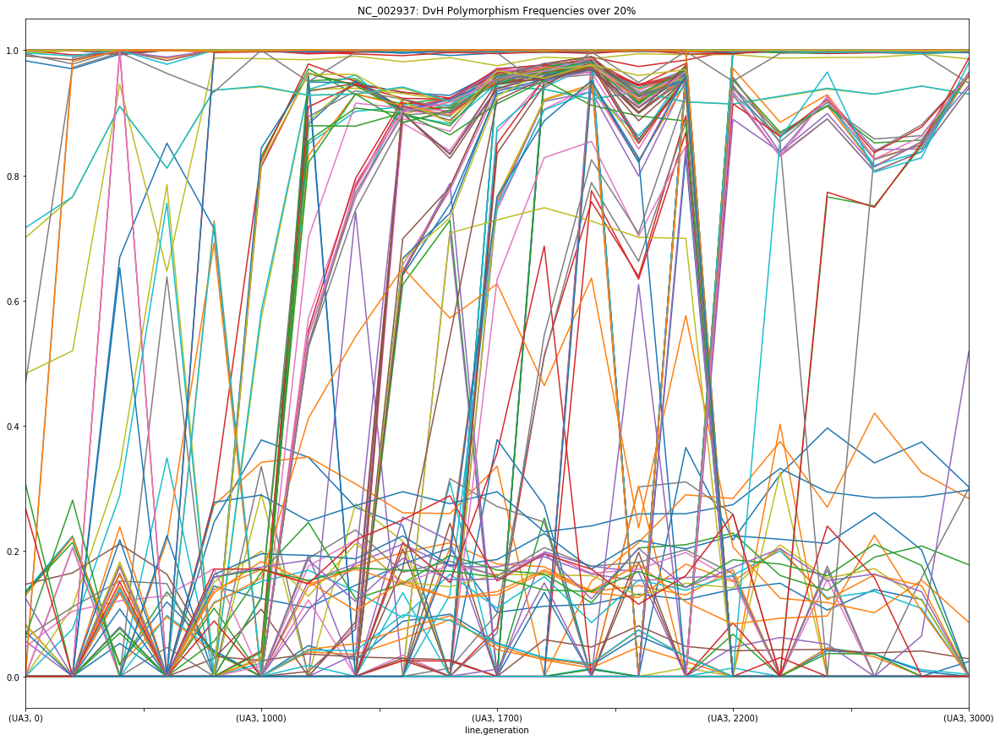

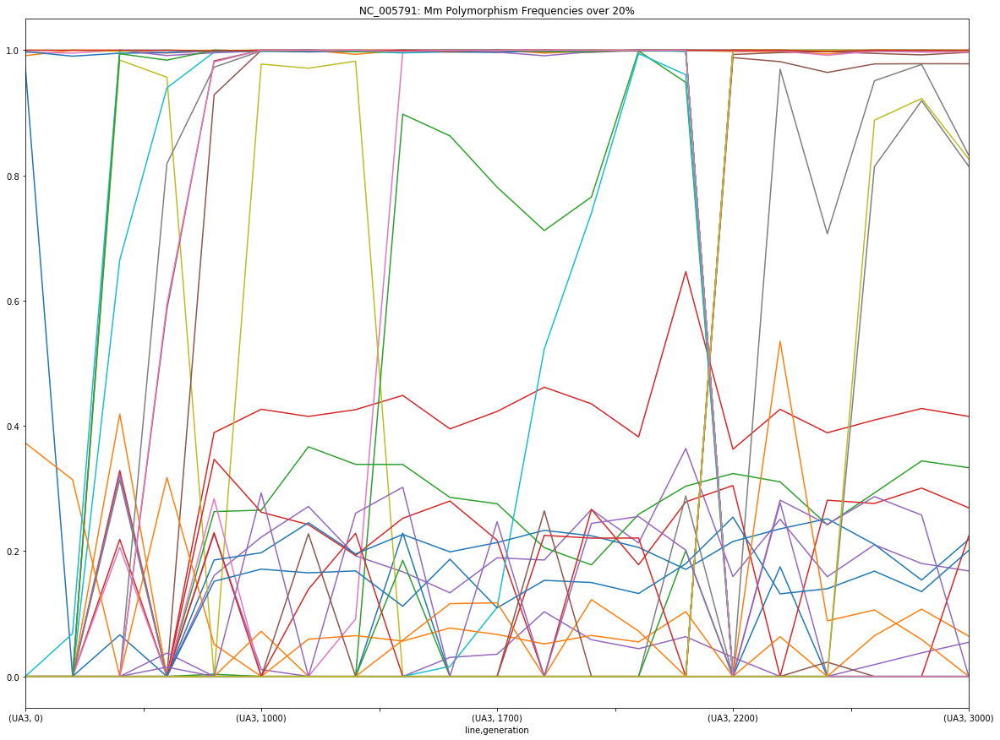

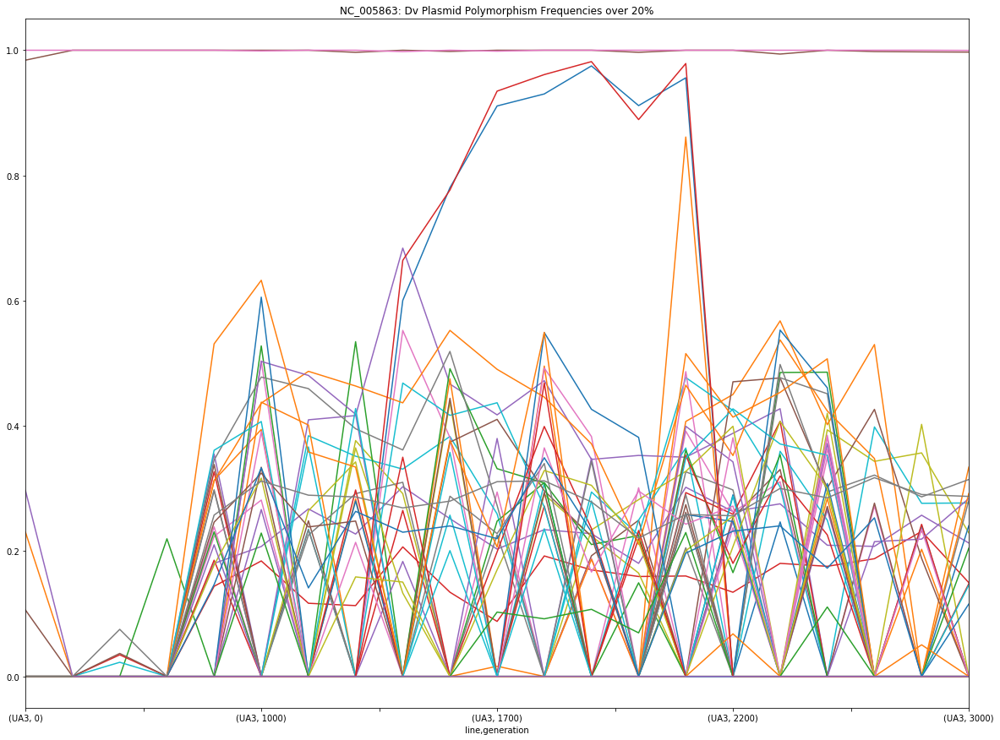

In [160]:
# To filter out mutations that never increase beyond 20% across all time points
dvh_df[dvh_df.mask(dvh_df < 0.2).dropna(how = 'all', axis=1).columns].plot(figsize = (20,15), legend=False, title='NC_002937: DvH Polymorphism Frequencies over 20%')
plt.savefig('figures/grc2019ua3dvhcorrected_min20.png')
mm_df[mm_df.mask(mm_df < 0.2).dropna(how = 'all', axis=1).columns].plot(figsize = (20,15), legend=False, title='NC_005791: Mm Polymorphism Frequencies over 20%')
plt.savefig('figures/grc2019ua3mmcorrected_min20.png')
dvplasmid_df[dvplasmid_df.mask(dvplasmid_df < 0.2).dropna(how = 'all', axis=1).columns].plot(figsize = (20,15), legend=False, title='NC_005863: Dv Plasmid Polymorphism Frequencies over 20%')
plt.savefig('figures/grc2019ua3dvplasmidcorrected_min20.png')

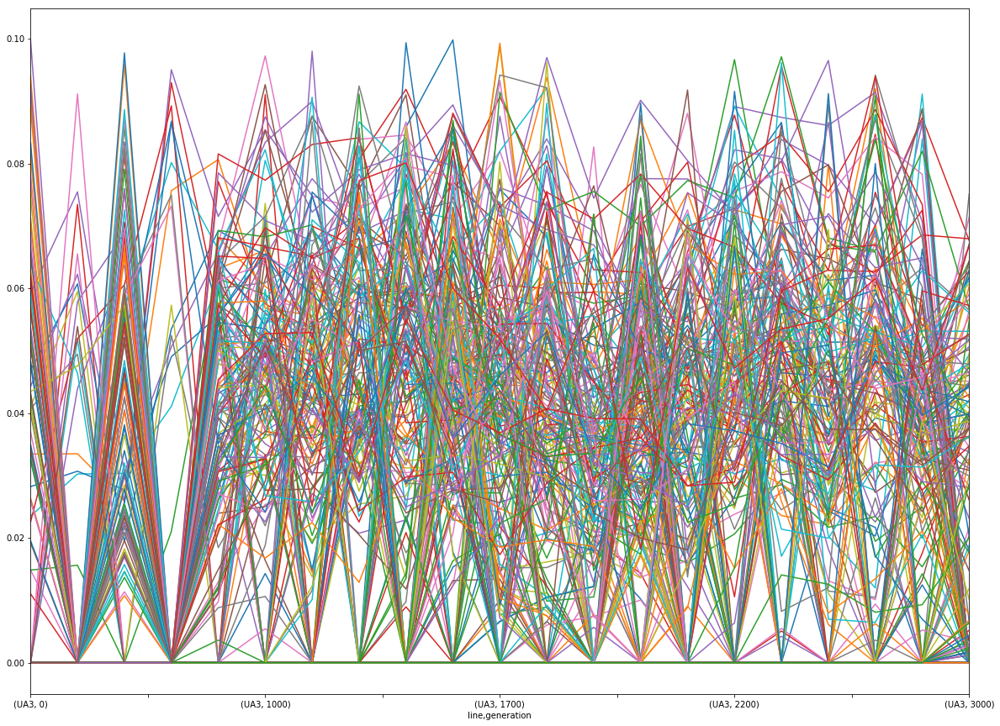

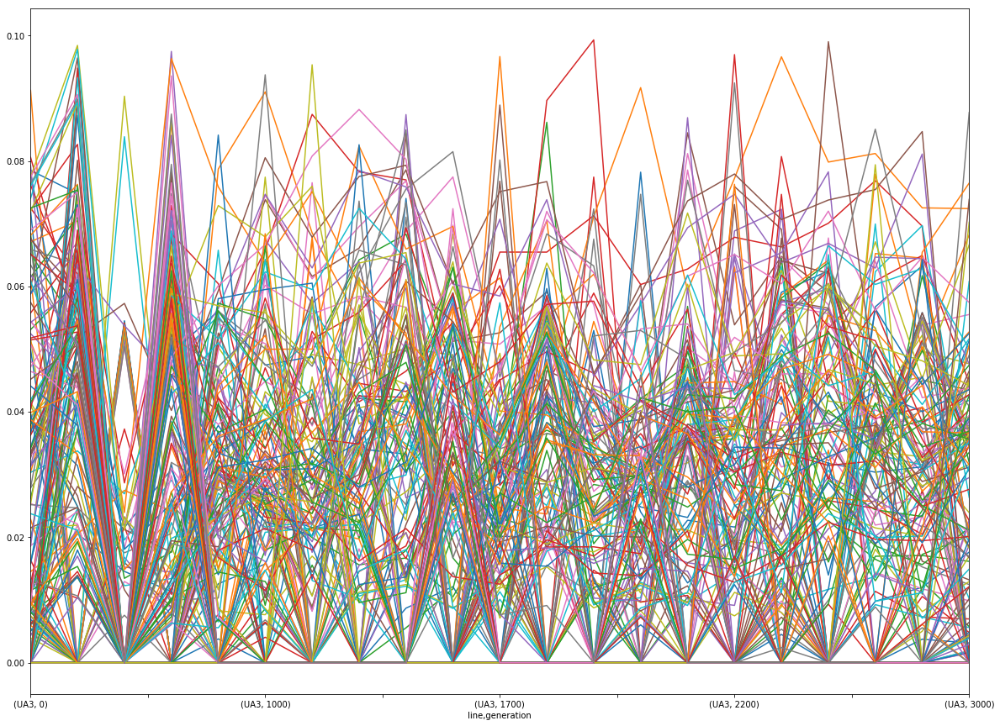

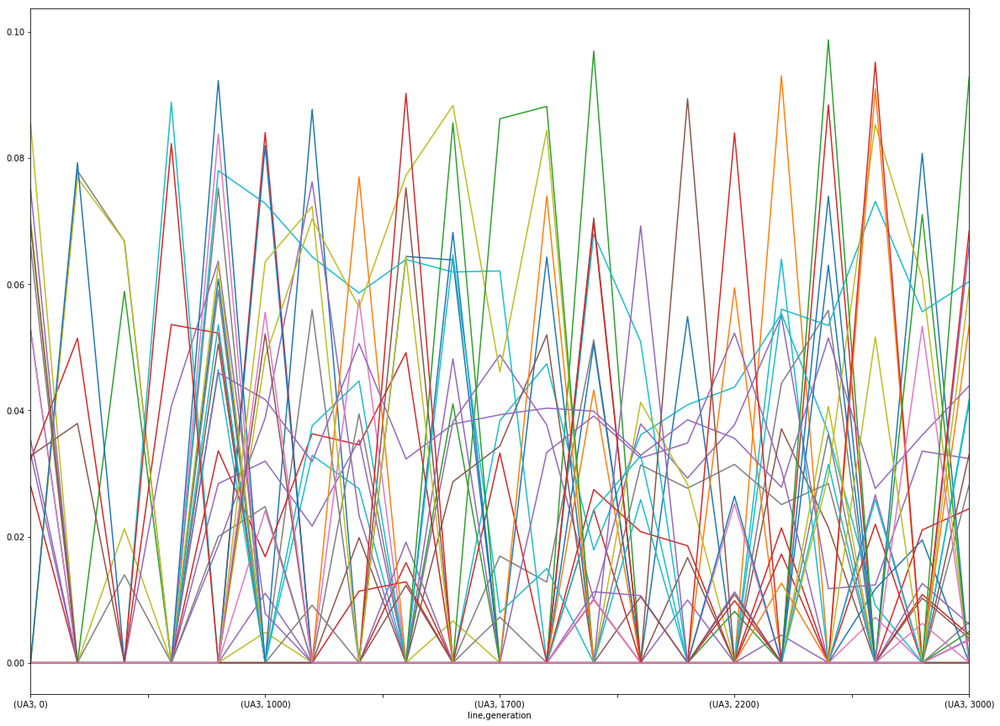

In [161]:
# To subset mutations that never increase beyond 10% across all time points
dvh_df[dvh_df.mask(dvh_df > 0.1).dropna(axis = 1).columns].plot(figsize = (20,15), legend=False)
mm_df[mm_df.mask(mm_df > 0.1).dropna(axis = 1).columns].plot(figsize = (20,15), legend=False)
dvplasmid_df[dvplasmid_df.mask(dvplasmid_df > 0.1).dropna(axis = 1).columns].plot(figsize = (20,15), legend=False)

### Genotype identification based on clonal isolates' mutations

In [16]:
ua3_iso = pd.read_csv('/Users/ymseah/Repositories/dvh_mms2/notebooks/data_exploration/input/ISO-ua3_mutev.csv')

In [17]:
new_ua3_iso = pd.merge(new_ua3, ua3_iso, on=('genome_id', 'position')).drop(['line_y', 'generation_y', 'entry_type_y', 'entry_id_y', 'evidence_id_y', 
                                          'mutation_detail_y', 'frequency_y', 'gene_product_y', 'evidence_type_y','reject_y', 
                                          'prediction_y', 'polymorphism_frequency_y', 'REF_y', 'ALT_y', 'major_cov_y', 'minor_cov_y', 
                                          'total_cov_y', 'ra_cov_y', 'jc_cov_y', 'mc_cov_y'], axis=1)

In [18]:
new_ua3_iso['sample_y'].unique()

array(['ISO-6', 'ISO-8', 'ISO-9', 'ISO-11', 'ISO-2', 'ISO-12', 'ISO-13',
       'ISO-14', 'ISO-18', 'ISO-20', 'ISO-21', 'ISO-37'], dtype=object)

In [165]:
#Individual plots 
for iso in new_ua3_iso['sample_y'].unique():
    df = new_ua3_iso[new_ua3_iso['sample_y'] == iso].pivot_table(index=['genome_id', 'generation_x'], columns='polymorphism', values='polymorphism_frequency_x')
    iso_dvh = dropallna_col(df.loc['NC_002937'])
    iso_dvh.plot(figsize = (20,15), legend=True, title='NC_002937: DvH '+ iso + ' Polymorphism Frequencies in UA3')
    plt.savefig('figures/grc2019ua3dvhcorrected_' + iso + '.png')
    plt.close()
    iso_dvplasmid = dropallna_col(df.loc['NC_005863'])
    iso_dvplasmid.plot(figsize = (20,15), legend=True, title='NC_005863: Dv plasmid '+ iso + ' Polymorphism Frequencies in UA3')
    plt.savefig('figures/grc2019ua3dvplasmidcorrected_' + iso + '.png')
    plt.close()
    #iso_mm = dropallna_col(df.loc['NC_005791'])
    #iso_mm.plot(figsize = (20,15), legend=True, title='NC_005791: Mm '+ iso + ' Polymorphism Frequencies in UA3')
    #plt.savefig('figures/grc2019ua3mmcorrected_' + iso + '.png')
    #plt.close()

In [167]:
dvh_iso = new_ua3_iso[new_ua3_iso['genome_id'] == 'NC_002937'].pivot_table(index=['sample_y', 'generation_x'], columns='polymorphism', values='polymorphism_frequency_x')
dvh_iso

polymorphism           1144620 C  1191167 .  1313341 C  1376015 T  1426830 G  \
sample_y generation_x                                                          
ISO-11   0              0.991039   1.000000   1.000000        NaN   1.000000   
         100            0.984659   1.000000   1.000000        NaN   1.000000   
         300            1.000000   1.000000   0.992663   0.669448   1.000000   
         500            0.983629   1.000000   1.000000   0.851544   1.000000   
         780            1.000000   1.000000   1.000000   0.714966   1.000000   
         1000           1.000000   0.998553   0.998418        NaN   1.000000   
         1100           0.994836   1.000000   1.000000   0.049274   1.000000   
         1200           1.000000   0.998037   1.000000   0.026533   1.000000   
         1500           1.000000   1.000000   0.997338   0.088143   1.000000   
         1600           0.997474   1.000000   1.000000   0.099443   1.000000   
         1700           1.000000   1.000000   1.000000   0.053264   1.000000   
         1800           1.000000   1.000000   0.998171   0.029125   0.998739   
         1900           0.998055   1.000000   1.000000   0.017788   1.000000   
         2000           0.997571   1.000000   1.000000   0.064937   1.000000   
         2100           0.997783   1.000000   1.000000   0.032851   1.000000   
         2200           0.995427   1.000000   1.000000        NaN   1.000000   
         2300           0.998559   1.000000   1.000000        NaN   1.000000   
         2400           1.000000   1.000000   0.998085        NaN   1.000000   
         2600           1.000000   0.997526   1.000000        NaN   1.000000   
         2800           0.998737   1.000000   0.997371        NaN   1.000000   
         3000           0.999572   0.999613   0.999574   0.023756   0.999306   
ISO-12   0              0.991039   1.000000   1.000000        NaN   1.000000   
         100            0.984659   1.000000   1.000000        NaN   1.000000   
         300            1.000000   1.000000   0.992663        NaN   1.000000   
         500            0.983629   1.000000   1.000000        NaN   1.000000   
         780            1.000000   1.000000   1.000000        NaN   1.000000   
         1000           1.000000   0.998553   0.998418        NaN   1.000000   
         1100           0.994836   1.000000   1.000000        NaN   1.000000   
         1200           1.000000   0.998037   1.000000        NaN   1.000000   
         1500           1.000000   1.000000   0.997338        NaN   1.000000   
...                          ...        ...        ...        ...        ...   
ISO-8    1900           0.998055   1.000000   1.000000        NaN   1.000000   
         2000           0.997571   1.000000   1.000000        NaN   1.000000   
         2100           0.997783   1.000000   1.000000        NaN   1.000000   
         2200           0.995427   1.000000   1.000000        NaN   1.000000   
         2300           0.998559   1.000000   1.000000        NaN   1.000000   
         2400           1.000000   1.000000   0.998085        NaN   1.000000   
         2600           1.000000   0.997526   1.000000        NaN   1.000000   
         2800           0.998737   1.000000   0.997371        NaN   1.000000   
         3000           0.999572   0.999613   0.999574        NaN   0.999306   
ISO-9    0              0.991039   1.000000   1.000000        NaN   1.000000   
         100            0.984659   1.000000   1.000000        NaN   1.000000   
         300            1.000000   1.000000   0.992663        NaN   1.000000   
         500            0.983629   1.000000   1.000000        NaN   1.000000   
         780            1.000000   1.000000   1.000000        NaN   1.000000   
         1000           1.000000   0.998553   0.998418        NaN   1.000000   
         1100           0.994836   1.000000   1.000000        NaN   1.000000   
         1200           1.000000   0.998037   1.000000        NaN   1.000000   
